## Importing necessary libraries

In [1]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB

from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import f1_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix

import plotly.figure_factory as ff
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

from scipy.stats import randint
import pandas as pd
import numpy as np

import warnings 
warnings.filterwarnings('ignore')

### Loading the dataset

In [2]:
df = pd.read_csv(r"C:\Users\HP\Desktop\DataScience - DT\DSData-master\WA_Fn-UseC_-HR-Employee-Attrition.csv")
df.head(10)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
5,32,No,Travel_Frequently,1005,Research & Development,2,2,Life Sciences,1,8,...,3,80,0,8,2,2,7,7,3,6
6,59,No,Travel_Rarely,1324,Research & Development,3,3,Medical,1,10,...,1,80,3,12,3,2,1,0,0,0
7,30,No,Travel_Rarely,1358,Research & Development,24,1,Life Sciences,1,11,...,2,80,1,1,2,3,1,0,0,0
8,38,No,Travel_Frequently,216,Research & Development,23,3,Life Sciences,1,12,...,2,80,0,10,2,3,9,7,1,8
9,36,No,Travel_Rarely,1299,Research & Development,27,3,Medical,1,13,...,2,80,2,17,3,2,7,7,7,7


## Exploratory Data Analysis

In [3]:
df.shape

(1470, 35)

In [4]:
df.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

There are 1470 columns and 35 features in the dataset. 

We are able to see that Attrition,Business Travel,Department,EducationField,Gender,JobRole,MaritalStatus
,Over18, and OverTime are the categorical columns. The remaining columns are continuous or discrete.

In [5]:
df.nunique()

Age                           43
Attrition                      2
BusinessTravel                 3
DailyRate                    886
Department                     3
DistanceFromHome              29
Education                      5
EducationField                 6
EmployeeCount                  1
EmployeeNumber              1470
EnvironmentSatisfaction        4
Gender                         2
HourlyRate                    71
JobInvolvement                 4
JobLevel                       5
JobRole                        9
JobSatisfaction                4
MaritalStatus                  3
MonthlyIncome               1349
MonthlyRate                 1427
NumCompaniesWorked            10
Over18                         1
OverTime                       2
PercentSalaryHike             15
PerformanceRating              2
RelationshipSatisfaction       4
StandardHours                  1
StockOptionLevel               4
TotalWorkingYears             40
TrainingTimesLastYear          7
WorkLifeBa

Some of the columns have the same value and will have no bearing on the accuracy of the model. We can drop those columns. Lets get rid of StandardHours, Over18, and EmployeeCount from our analysis

In [6]:
df1 = df.drop(['StandardHours','Over18','EmployeeCount'],axis = 1)

In [7]:
df1.shape

(1470, 32)

In [8]:
df1.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSinceLastPromotion     0
YearsWithCurrManager        0
dtype: int64

In [9]:
df1.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1024.865306,2.721769,65.891156,2.729932,2.063946,2.728571,...,3.153741,2.712245,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,602.024335,1.093082,20.329428,0.711561,1.106940,1.102846,...,0.360824,1.081209,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,...,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,491.250000,2.000000,48.000000,2.000000,1.000000,2.000000,...,3.000000,2.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1020.500000,3.000000,66.000000,3.000000,2.000000,3.000000,...,3.000000,3.000000,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1555.750000,4.000000,83.750000,3.000000,3.000000,4.000000,...,3.000000,4.000000,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,2068.000000,4.000000,100.000000,4.000000,5.000000,4.000000,...,4.000000,4.000000,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


Looking at the numeric columns of the dataset, we see a more or less normalized dataset as mean is close to median in most of the columns. We are also able to see that there are no null columns. Let us analyze the numerical columns using a histogram

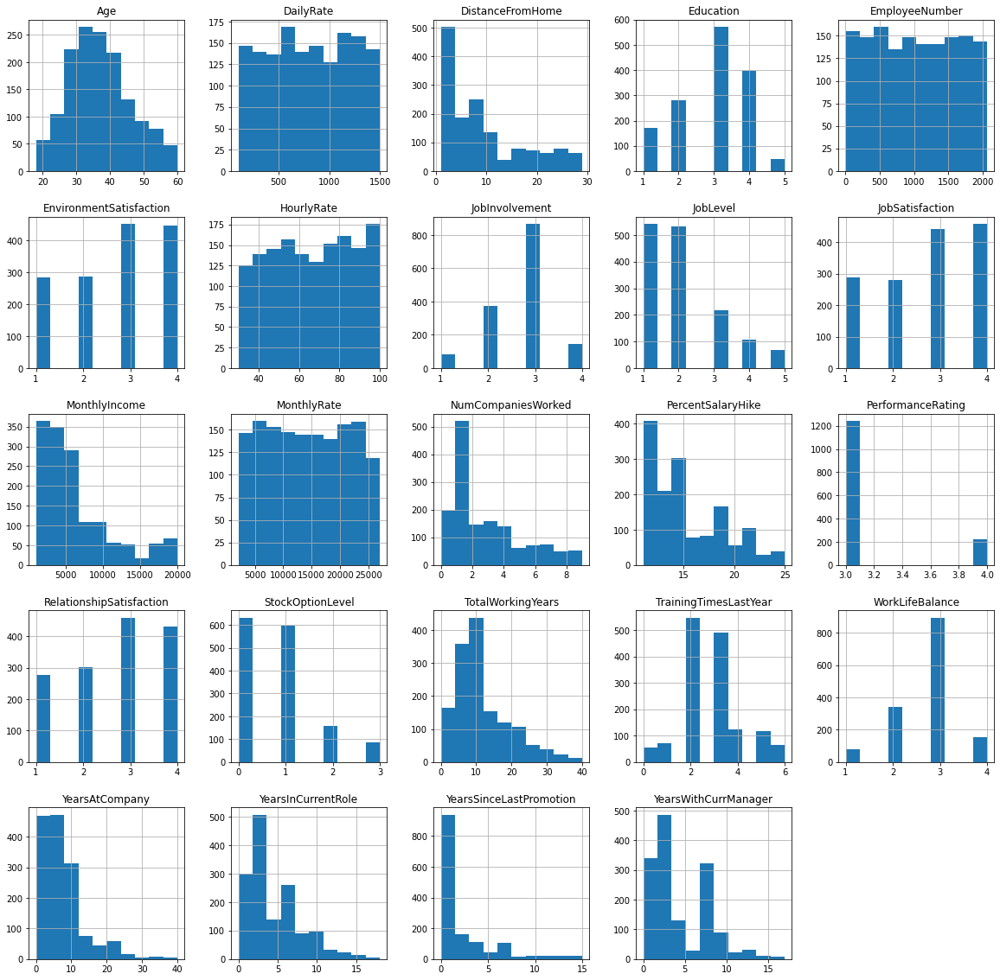

In [10]:
df1.hist(figsize = (20,20))
plt.show()

Looking at the columns we are able to see the min and max ranges of all the columns and see if a specific column has a single value with much higher concentration. For instance,

    1. Of the 1470 employees data that is given to us, more than 60%(900+ employees) have 0 years since last promotion
    2. A major part of the workforce has been working in the company for a short period of time( less than 10 years)
    3. Though the average monthly salary is between 5000 and 20000, only 400-500 employees earn in excess of 6000
    4. Looking at the Performance Rating it is clear than only 15-20% attain the performance band of 4. A majority of the employees(1200+) get the lower Performance Rating of 3.
    5. More than 70% of the employees have worked in less than 5 companies before working for the current organization, with atleast 50% of the total workforce who had worked in only one other company before joining this organization.
    6. Almost 1000 employees have lesser than 5 years in a current role. We need to look at how this affects attrition
    7. Looking at the percent salary hike column, it is quite clear 900+(almost 65%) have a percentage hike of less than 15%
    8. Distance from home - A majority of the employees stay at a distance less than 10.
    9. Employee number is like an identity column and should have no affect on the accuracy of the model. Also, daily rate, hourly rate, and monthly rate are evenly spread out


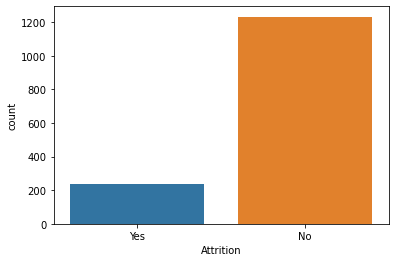

In [11]:
ax = sns.countplot(x='Attrition',data=df1)
plt.show()             

In [12]:
df['Attrition'].value_counts()

No     1233
Yes     237
Name: Attrition, dtype: int64

From the counts of the target variable(Attrition), we are able to say that this is an imbalanced set. Hence, we need to perform undersampling or oversampling. We can also see that a majority of the people stay with the organization and very few leave it.

<AxesSubplot:xlabel='Attrition', ylabel='count'>

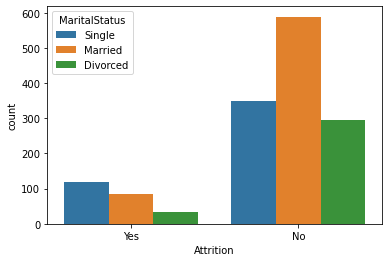

In [13]:
sns.countplot(x='Attrition', hue="MaritalStatus", data=df1)

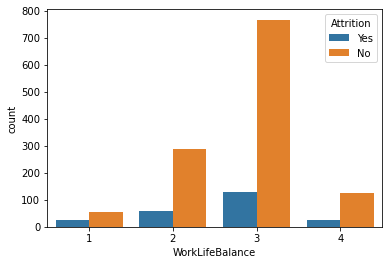

In [14]:
ax = sns.countplot(x='WorkLifeBalance', hue='Attrition', data=df1)
plt.show()

Looking at the column marital status, we are able to acertain that a majority of poeople who quit are single and those who are married or divorced rarely quit the orgranization. Almost 20%(100+ out of 500) of the "single" poeple quit the organization for better oppurtunities. Work life balance doesn't seem to influence attrition to a great extent since attrition is equally distributed accross the work life balance levels.

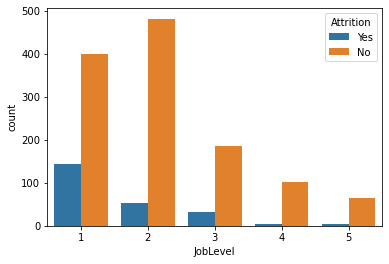

In [15]:
ax = sns.countplot(x='JobLevel',hue="Attrition", data=df1)
plt.show() 

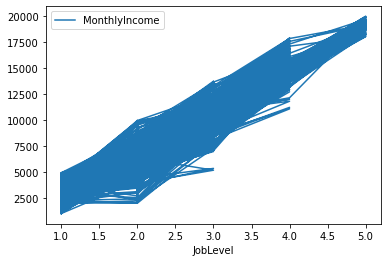

In [16]:
df1.plot(x="JobLevel", y="MonthlyIncome", kind="line")
plt.show()

Looking at the column Job level, we are able to acertain that a majority of poeople who quit are in the beginning stages of their career. In the total number of people who quit the company, almost 70% of the people are from Job level 1. From the line plot, we are able to acertain that Job level 1 is the lowest level and Job level 5 is the senior most level with people drawning high salaries. 

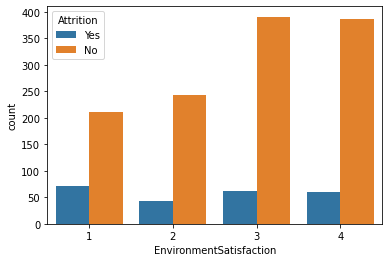

In [17]:
ax = sns.countplot(x='EnvironmentSatisfaction',hue="Attrition", data=df1)
plt.show() 

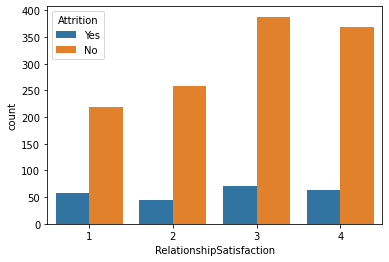

In [18]:
ax = sns.countplot(x='RelationshipSatisfaction',hue="Attrition", data=df1)
plt.show() 

Looking at the columns - Relationship and Environment Satisfaction, employees with lower satisfaction levels have a slightly higher chance of leaving the company but overall, these columns don't affect attrition to such an extent

<AxesSubplot:xlabel='PerformanceRating', ylabel='count'>

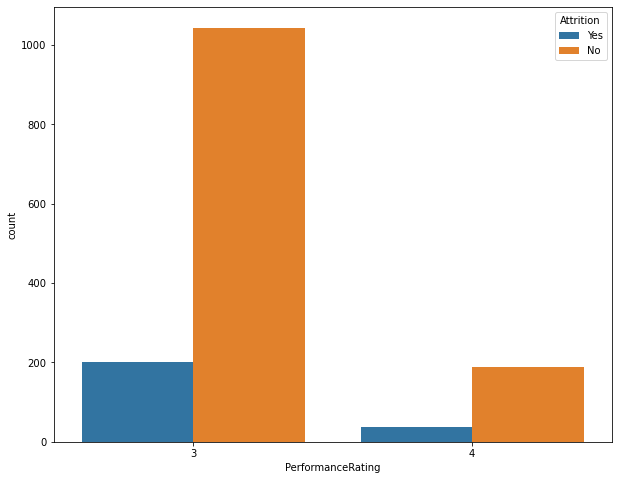

In [19]:
plt.figure(figsize = (10,8))
sns.countplot(x = 'PerformanceRating', hue = 'Attrition', data = df1)

On comparing Performance rating with Attrition, we are able to clearly understand that people with the performance rating 3 are more likely to quit. Comparing performance rating with salary hikes, it is clear that people with Performance level 4 have a better performance because they get better salary hikes

Text(0.5, 1.0, 'Attrition Vs JobSatisfaction')

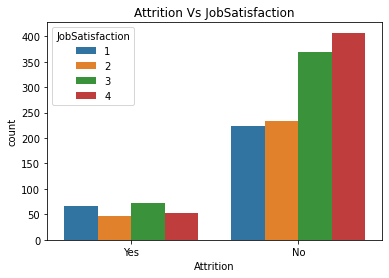

In [20]:
sns.countplot(x='Attrition',hue='JobSatisfaction',data=df1)
plt.title("Attrition Vs JobSatisfaction")

Text(0.5, 1.0, 'Attrition Vs RelationshipSatisfaction')

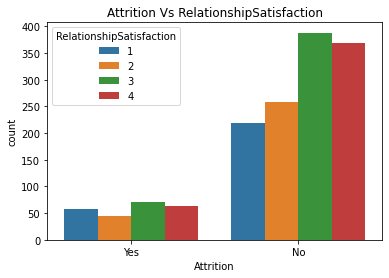

In [21]:
sns.countplot(x='Attrition',hue='RelationshipSatisfaction',data=df1)
plt.title("Attrition Vs RelationshipSatisfaction")

<AxesSubplot:xlabel='Attrition', ylabel='count'>

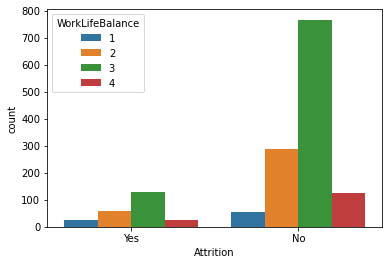

In [22]:
sns.countplot(x='Attrition',hue='WorkLifeBalance',data=df1)

Looking at the above given plots, we are able to see that people who quit are experiencing lower levels of job satisfaction.
If we look at the numbers, it is quite clear that job satisfaction is a very important reason for an employee leaving the organization. 

    1. Of the total employees experiencing a job satisfaction level of 1 and 2, almost 20%(100+ out of around 500) quit with the number being higher with employees who have a job satisfaction level of 1.
    2. Lookings at work life balance, number of employees having work life balance of 1 are most likely to quit.
    3. Similarly, employee having RelationshipSatisfaction of 1 or 2 are more likely to quit

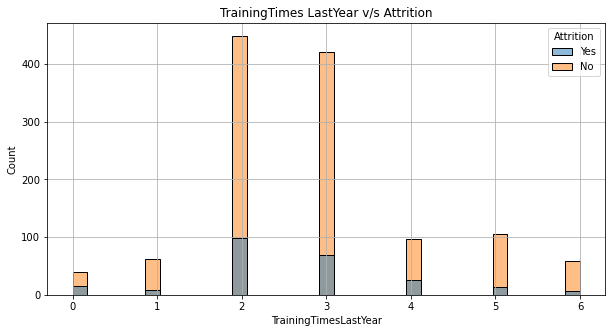

In [23]:
plt.figure(figsize=(10,5))
sns.histplot(x='TrainingTimesLastYear',hue='Attrition',data=df1)
plt.title("TrainingTimes LastYear v/s Attrition")
plt.grid()

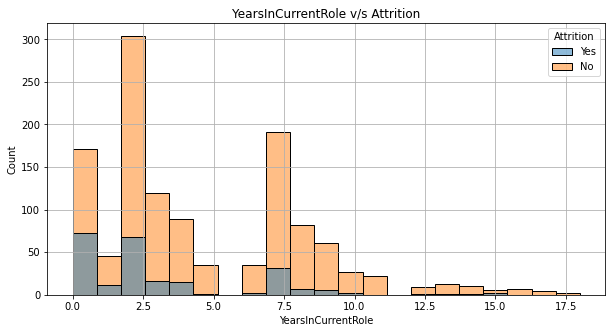

In [24]:
plt.figure(figsize=(10,5))
sns.histplot(x='YearsInCurrentRole',hue='Attrition',data=df1)
plt.title("YearsInCurrentRole v/s Attrition")
plt.grid()

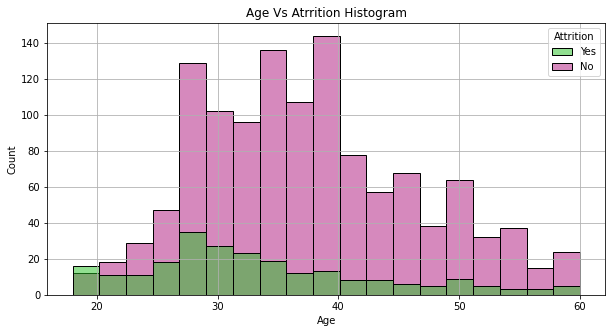

In [25]:
plt.figure(figsize=(10,5))
sns.histplot(x='Age',hue='Attrition',data=df1,palette=('#24c123','#ae147d'))
plt.title("Age Vs Atrrition Histogram")
plt.grid()

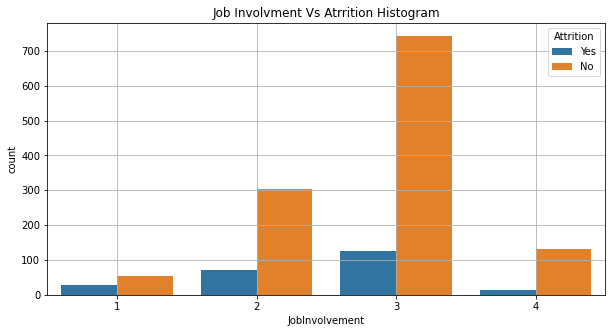

In [26]:
plt.figure(figsize=(10,5))
sns.countplot(x='JobInvolvement',hue='Attrition',data=df1)
plt.title("Job Involvment Vs Atrrition Histogram")
plt.grid()

Looking at the Age V/S Attrition histogram, we see that a majority of the poeple who quit the company are between 28 and 38.  
Looking at the Job Involvement V/S Attrition histogram, we see that there is a higher percentage of people with lesser involvement quit the company. People who are very involved are less likely to quit the company. As such, number of times an employee is trained does not influence attrition to that extent since an overall 25% quit at each level

In [27]:
#Encoding the Label column in order to perform EDA
from sklearn.preprocessing import LabelEncoder
lb = LabelEncoder()
df1['Attrition'] = lb.fit_transform(df1['Attrition'])

In [28]:
#initializing an empty list to get the percentages of attrition based on the education field
ed_list = []

#intializing an empty list to get the names of all the education fields
ed_nm = [df1['EducationField'].unique()]

for i in df1['EducationField'].unique():
    ed_list.append((df1[(df1['EducationField']==i) & (df1['Attrition'] == 1)].shape[0]/df1[df1['EducationField']==i].shape[0])*100)
    
    
pd.DataFrame(ed_list,ed_nm,columns=['Attrition percentage based on field of education'])

,Attrition percentage based on field of education
Life Sciences,14.686469
Other,13.414634
Medical,13.577586
Marketing,22.012579
Technical Degree,24.242424
Human Resources,25.925926


In [29]:
xticks = ['Attrition in Females','Attrition in Males']
percentag = ((df1[df1['Attrition'] == 1].groupby('Gender').agg('count'))/(df1.groupby('Gender').agg('count')) *100)['Attrition']
percentag.value_counts

<bound method IndexOpsMixin.value_counts of Gender
Female    14.795918
Male      17.006803
Name: Attrition, dtype: float64>

Looking at the above 2 value counts, we can deduce the following:
    
    1. Males have a higher attrition percentage when compared to the Females. 
    2. Using EducationField to check the attrition, HR seems to have the highest percentage of attrition and this is closely followed by employees who have the Technical degree.
    3. Fields such as Life Sciences and Medical seem to have a highest retention in the organization

In [30]:
df1['Attrition'].value_counts()

0    1233
1     237
Name: Attrition, dtype: int64

In [31]:
df_check = df1[df1['Attrition'] == 1]
fig = px.histogram(df_check, x= 'MonthlyIncome')
fig.show()

In [32]:
df_check1 = df1[df1['Attrition'] == 1]
fig = px.histogram(df_check1, x= 'PercentSalaryHike')
fig.show()

In [33]:
df_check2 = df1[df1['Attrition'] == 1]
fig = px.histogram(df_check2, x= 'StockOptionLevel')
fig.show()

Looking at the above columns for people who leave the organization, we can draw the following conclusions

    1. The highest number of people leave are drawing the minimum salaries in the organization. As there is an increase in salary, the number of people leaving the organiztion reduce. 179(around 76%) employees who quit had a salary lesser than 6000 per month.
    2. People who have a stock Option level of 2 and 3 very rarely leave the organization. Of 237 employees who quit only 27 belong to this category
    3. 15% salary hike seems to be a good average that a vast majority of the employees accept. 150 employees(almost 63%) of the people who quit received a salary hike of 15% or less.

### Finding pairwise correlation of the various features

In [34]:
df1.corr(method='pearson')

,Age,Attrition,DailyRate,DistanceFromHome,Education,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,-0.159205,0.010661,-0.001686,0.208034,-0.010145,0.010146,0.024287,0.029820,0.509604,...,0.001904,0.053535,0.037510,0.680381,-0.019621,-0.021490,0.311309,0.212901,0.216513,0.202089
Attrition,-0.159205,1.000000,-0.056652,0.077924,-0.031373,-0.010577,-0.103369,-0.006846,-0.130016,-0.169105,...,0.002889,-0.045872,-0.137145,-0.171063,-0.059478,-0.063939,-0.134392,-0.160545,-0.033019,-0.156199
DailyRate,0.010661,-0.056652,1.000000,-0.004985,-0.016806,-0.050990,0.018355,0.023381,0.046135,0.002966,...,0.000473,0.007846,0.042143,0.014515,0.002453,-0.037848,-0.034055,0.009932,-0.033229,-0.026363
DistanceFromHome,-0.001686,0.077924,-0.004985,1.000000,0.021042,0.032916,-0.016075,0.031131,0.008783,0.005303,...,0.027110,0.006557,0.044872,0.004628,-0.036942,-0.026556,0.009508,0.018845,0.010029,0.014406
Education,0.208034,-0.031373,-0.016806,0.021042,1.000000,0.042070,-0.027128,0.016775,0.042438,0.101589,...,-0.024539,-0.009118,0.018422,0.148280,-0.025100,0.009819,0.069114,0.060236,0.054254,0.069065
EmployeeNumber,-0.010145,-0.010577,-0.050990,0.032916,0.042070,1.000000,0.017621,0.035179,-0.006888,-0.018519,...,-0.020359,-0.069861,0.062227,-0.014365,0.023603,0.010309,-0.011240,-0.008416,-0.009019,-0.009197
EnvironmentSatisfaction,0.010146,-0.103369,0.018355,-0.016075,-0.027128,0.017621,1.000000,-0.049857,-0.008278,0.001212,...,-0.029548,0.007665,0.003432,-0.002693,-0.019359,0.027627,0.001458,0.018007,0.016194,-0.004999
HourlyRate,0.024287,-0.006846,0.023381,0.031131,0.016775,0.035179,-0.049857,1.000000,0.042861,-0.027853,...,-0.002172,0.001330,0.050263,-0.002334,-0.008548,-0.004607,-0.019582,-0.024106,-0.026716,-0.020123
JobInvolvement,0.029820,-0.130016,0.046135,0.008783,0.042438,-0.006888,-0.008278,0.042861,1.000000,-0.012630,...,-0.029071,0.034297,0.021523,-0.005533,-0.015338,-0.014617,-0.021355,0.008717,-0.024184,0.025976
JobLevel,0.509604,-0.169105,0.002966,0.005303,0.101589,-0.018519,0.001212,-0.027853,-0.012630,1.000000,...,-0.021222,0.021642,0.013984,0.782208,-0.018191,0.037818,0.534739,0.389447,0.353885,0.375281


<AxesSubplot:>

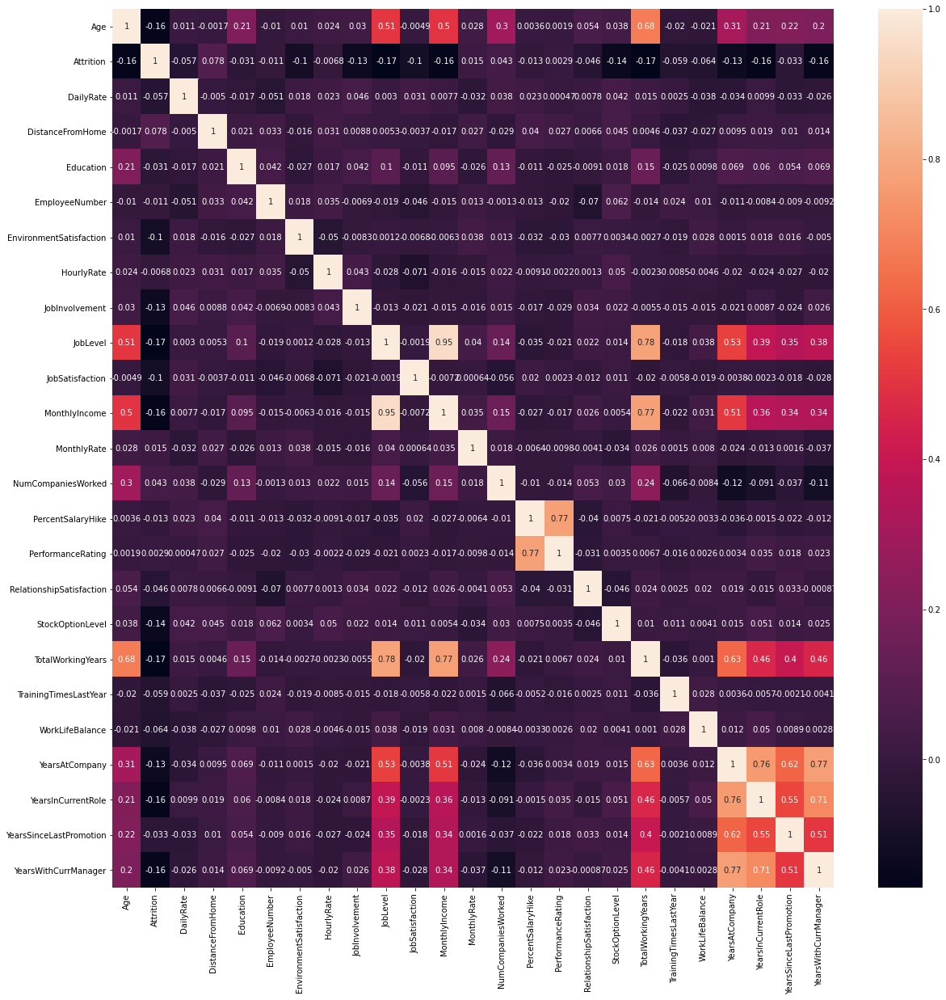

In [35]:
#Plotting correlation using heatmap
plt.figure(figsize=(20,20))
sns.heatmap(df1.corr(),annot=True)

We are able to see a very high positive correlation between Monthly income and Job Level. We are also able to high correlation between some of the features listed below:


    1. Total Working Years V/S Job level 
    2. Total Working Years V/S Monthly income
    3. Years in current role V/S Years at Company
    4. Years with Curr Manager V/S Years at Company
    5. Years with Curr Manager V/S Years in current role
    6. Performance Rating V/S Percent Salary Hike

<Figure size 720x720 with 0 Axes>

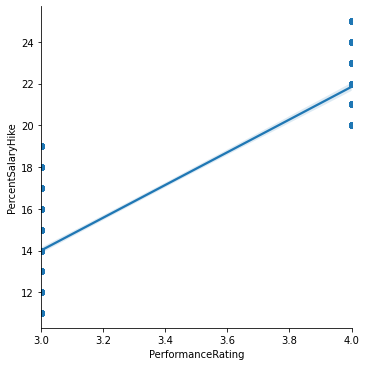

In [36]:
plt.figure(figsize=(10,10))
sns.lmplot(x='PerformanceRating',y='PercentSalaryHike',data=df1)

<Figure size 720x720 with 0 Axes>

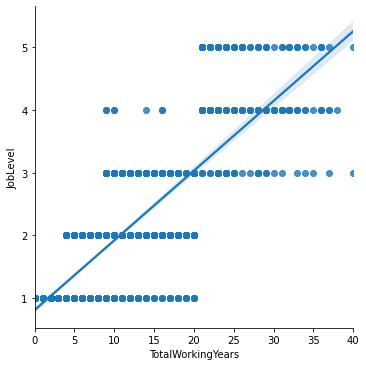

In [37]:
plt.figure(figsize=(10,10))
sns.lmplot(x='TotalWorkingYears',y='JobLevel',data=df1)

We are able to confirm the "Performance Rating V/S Percent Salary Hike" and "Total Working Years V/S Job level" correlation by means of the above plots. Lets plot a pair plot to see more details 

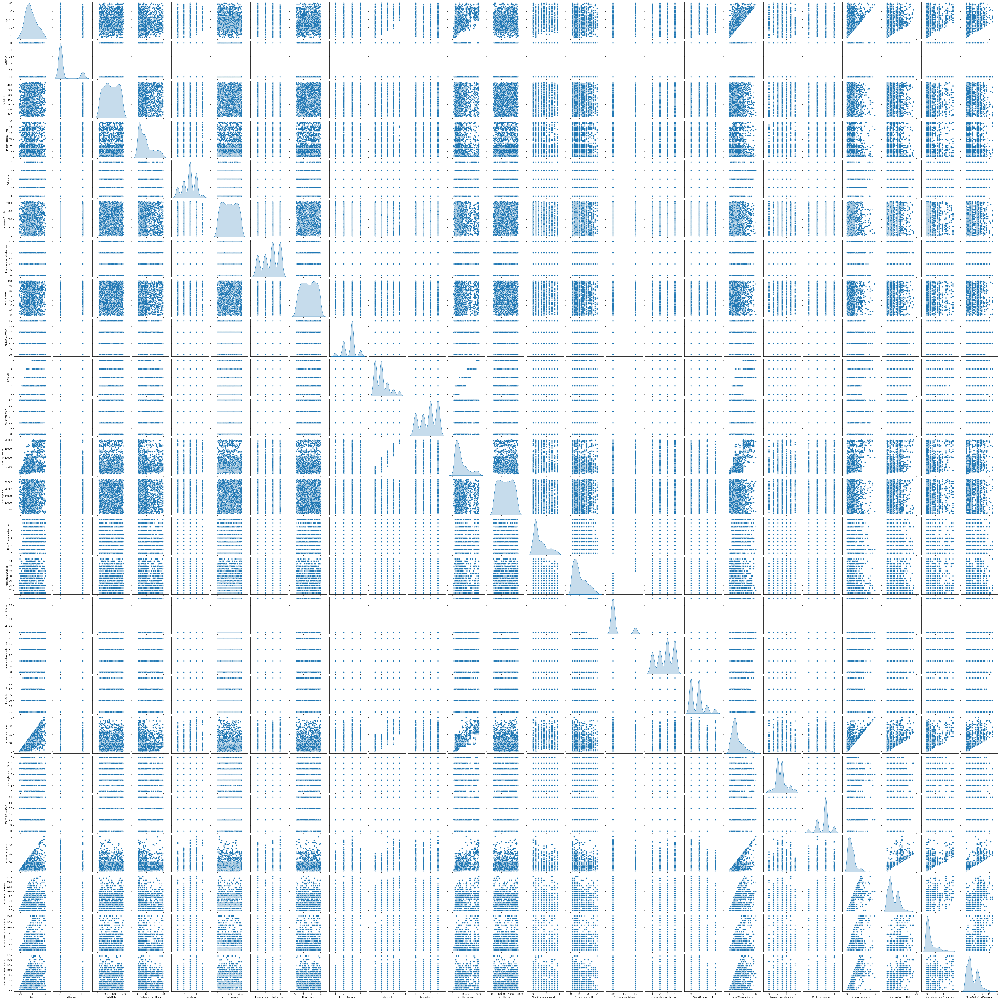

In [38]:
sns.pairplot(df1,diag_kind = "kde",palette="magma")

## Feature engineering

In [39]:
df1.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,2,...,3,1,0,8,0,1,6,4,0,5
1,49,0,Travel_Frequently,279,Research & Development,8,1,Life Sciences,2,3,...,4,4,1,10,3,3,10,7,1,7
2,37,1,Travel_Rarely,1373,Research & Development,2,2,Other,4,4,...,3,2,0,7,3,3,0,0,0,0
3,33,0,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,5,4,...,3,3,0,8,3,3,8,7,3,0
4,27,0,Travel_Rarely,591,Research & Development,2,1,Medical,7,1,...,3,4,1,6,3,3,2,2,2,2


In [40]:
#Encoding via Label Encoder - Business Travel/Department/Education Field/Gender
from sklearn.preprocessing import LabelEncoder
lb = LabelEncoder()
df1['BusinessTravel'] = lb.fit_transform(df1['BusinessTravel'])
df1['Department'] = lb.fit_transform(df1['Department'])
df1['EducationField'] = lb.fit_transform(df1['EducationField'])
df1['Gender'] = lb.fit_transform(df1['Gender'])
#Encoding via Label Encoder - Marital Status/JobRole/Overtime column(s)
df1['MaritalStatus'] = lb.fit_transform(df1['MaritalStatus'])
df1['JobRole'] = lb.fit_transform(df1['JobRole'])
df1['OverTime'] = lb.fit_transform(df1['OverTime'])
df1.head(10)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,2,1102,2,1,2,1,1,2,...,3,1,0,8,0,1,6,4,0,5
1,49,0,1,279,1,8,1,1,2,3,...,4,4,1,10,3,3,10,7,1,7
2,37,1,2,1373,1,2,2,4,4,4,...,3,2,0,7,3,3,0,0,0,0
3,33,0,1,1392,1,3,4,1,5,4,...,3,3,0,8,3,3,8,7,3,0
4,27,0,2,591,1,2,1,3,7,1,...,3,4,1,6,3,3,2,2,2,2
5,32,0,1,1005,1,2,2,1,8,4,...,3,3,0,8,2,2,7,7,3,6
6,59,0,2,1324,1,3,3,3,10,3,...,4,1,3,12,3,2,1,0,0,0
7,30,0,2,1358,1,24,1,1,11,4,...,4,2,1,1,2,3,1,0,0,0
8,38,0,1,216,1,23,3,1,12,4,...,4,2,0,10,2,3,9,7,1,8
9,36,0,2,1299,1,27,3,3,13,3,...,3,2,2,17,3,2,7,7,7,7


After encoding all the categorical columns, let us move to removal of outliers so that the performance of the model can be improved

### Identifying outliers and removal of outliers using Z-score

In [41]:
df1.skew()

Age                         0.413286
Attrition                   1.844366
BusinessTravel             -1.439006
DailyRate                  -0.003519
Department                  0.172231
DistanceFromHome            0.958118
Education                  -0.289681
EducationField              0.550371
EmployeeNumber              0.016574
EnvironmentSatisfaction    -0.321654
Gender                     -0.408665
HourlyRate                 -0.032311
JobInvolvement             -0.498419
JobLevel                    1.025401
JobRole                    -0.357270
JobSatisfaction            -0.329672
MaritalStatus              -0.152175
MonthlyIncome               1.369817
MonthlyRate                 0.018578
NumCompaniesWorked          1.026471
OverTime                    0.964489
PercentSalaryHike           0.821128
PerformanceRating           1.921883
RelationshipSatisfaction   -0.302828
StockOptionLevel            0.968980
TotalWorkingYears           1.117172
TrainingTimesLastYear       0.553124
W

In [42]:
#Outlier removal using z-score technique
from scipy.stats import zscore
z = np.abs(zscore(df1))
df_final = df1[(z<3).all(axis = 1)]

In [43]:
df_final.shape

(1387, 32)

Of the 1470 rows, 83 rows are removed after applying z-score and removing the outliers. The loss of data(less than 6%) is within permissable limit

## Machine Learning Algorithms

In [44]:
df_final.shape
X = df_final.drop('Attrition', axis = 1)
y = df_final.loc[:,'Attrition']
print(X.shape," : Features")

(1387, 31)  : Features


In [45]:
#Splitting the features and label after importing necessary libraries
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.25,random_state = 73)

In [46]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X = sc.fit_transform(df_final)

In [47]:
models = [LogisticRegression(max_iter=1200000, dual = False), RandomForestClassifier(), DecisionTreeClassifier(),GaussianNB(),AdaBoostClassifier(),AdaBoostClassifier(RandomForestClassifier())]
model_names = ['Logistic Regression', 'Random Forest Classifier','Decision Tree Classifier', 'Naive Bayes','Adaboost Classifier','Adaboost with Random Forest']
f1_score_ = []
roc_auc = []
overall = []
for i,j in zip(model_names,models):
    clf = j
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    f1_score_ =  f1_score(y_test,y_pred) * 100
    roc_auc = roc_auc_score(y_test,y_pred) * 100
    overall.append([i,f1_score_,roc_auc])

In [48]:
Score = pd.DataFrame(overall, columns = ['Model Name','F1-Score','ROC AUC Score'])

In [49]:
Score

,Model Name,F1-Score,ROC AUC Score
0,Logistic Regression,52.500000,69.484848
1,Random Forest Classifier,35.820896,61.158249
2,Decision Tree Classifier,34.426230,62.414141
3,Naive Bayes,46.913580,75.542088
4,Adaboost Classifier,54.166667,72.632997
5,Adaboost with Random Forest,30.769231,59.158249


Of the following machine building models, Naive Bayes and Logistic Regression have the best accuracy. Let us use GridSearch CV to see if we can improve the accuracy of the Logistic Regression model by fine tuning the model.

#### Hyper-parameter tuning using GridSearch CV 

In [50]:
grid={'C': np.arange(0, 2, 0.01)}
log_GS = GridSearchCV(LogisticRegression(solver='liblinear',class_weight="balanced", random_state=7)
                      , param_grid = grid, verbose=True,return_train_score=True,scoring = 'roc_auc', iid = True, cv = 10 )
log_GS.fit(X_train,y_train)
print('Best Estimator : {}'.format(log_GS.best_estimator_))
print('Best Score : {}'.format(log_GS.best_score_))

Fitting 10 folds for each of 200 candidates, totalling 2000 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Best Estimator : LogisticRegression(C=1.6400000000000001, class_weight='balanced',
                   random_state=7, solver='liblinear')
Best Score : 0.8005091959264325


[Parallel(n_jobs=1)]: Done 2000 out of 2000 | elapsed:  1.9min finished


In [51]:
clf_bmod = LogisticRegression(C=1.6400000000000001, class_weight='balanced',random_state=7, solver='liblinear')
clf_bmod.fit(X_train,y_train)
y_pred = clf_bmod.predict(X_test)

In [52]:
print('F1-Score',f1_score(y_test,y_pred)*100)
print('AUC ROC Score',roc_auc_score(y_test,y_pred)*100)

F1-Score 46.62576687116564
AUC ROC Score 75.37373737373736


After hyperparameter tuning, we are able to sightly increase the AUC ROC score. However, the naive bayes model is still the best fit

#### Hyper-parameter tuning using Randomized Search CV 

In [53]:
from sklearn.model_selection import RandomizedSearchCV
  
# Creating the hyperparameter grid 
param_dist = {"max_depth": [3, None],
              "max_features": randint(1, 29),
              "min_samples_leaf": randint(1, 29),
              "criterion": ["gini", "entropy"]}
  
# Instantiating RandomizedSearchCV object
tree_cv = RandomizedSearchCV(DecisionTreeClassifier(), param_dist, cv = 5)
  
tree_cv.fit(X_train,y_train)
  
# Print the tuned parameters and score
print("Tuned Decision Tree Parameters: {}".format(tree_cv.best_params_))
print("Best score is {}".format(tree_cv.best_score_))

Tuned Decision Tree Parameters: {'criterion': 'gini', 'max_depth': None, 'max_features': 26, 'min_samples_leaf': 24}
Best score is 0.8451923076923077


In [54]:
tree_bmod = DecisionTreeClassifier(criterion = "entropy", max_depth= 3, max_features= 8, min_samples_leaf= 2)

tree_bmod.fit(X_train,y_train)
y_pred = tree_bmod.predict(X_test)

In [55]:
print('F1-Score',f1_score(y_test,y_pred)*100)
print('AUC ROC Score',roc_auc_score(y_test,y_pred)*100)

F1-Score 40.86021505376344
AUC ROC Score 64.95959595959594


Here, the auc-roc score reduces further and we are able to confirm that the Naive Bayes is the best fit model

#### Saving the best model 

In [56]:
best_model = GaussianNB()

In [57]:
best_model.fit(X_train, y_train)
y_pred = best_model.predict(X_test)

In [58]:
best_model.score(X_test,y_test)

0.7521613832853026

In [59]:
# saving the best model
import joblib
joblib.dump(best_model,'HRAttrition.pkl')

['HRAttrition.pkl']